In [1]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [2]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
from collections import deque

%matplotlib qt

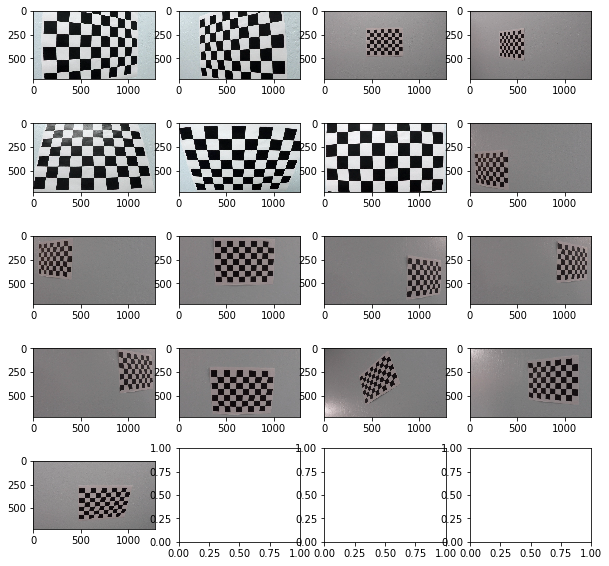

In [3]:
##to visualize the distorted images
images = glob.glob('/Users/thiyagarajanramanathan/Desktop/CarND-Advanced-Lane-Lines/camera_cal/calibration*.jpg')
f, ax = plt.subplots(5,4,figsize=(10,10))
for i in range(5):
    for j in range(4):
        ax[i,j].imshow(cv2.imread(images[i*4+j]))
        if i*5+j>=20:
            break

In [4]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.


# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)  
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

Text(0.5,1,'Undistorted Image')

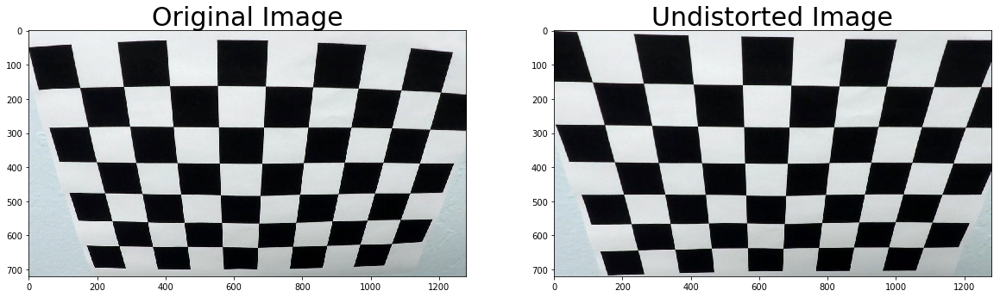

In [5]:
import pickle
%matplotlib inline

# Test undistortion on an image
img = cv2.imread(images[5])
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


dst = cv2.undistort(img, mtx, dist, None, mtx)

#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

In [6]:
##Function for undistorting the image
def undistort(image):
    undist = cv2.undistort(test_img, mtx, dist, None, mtx)
    return undist

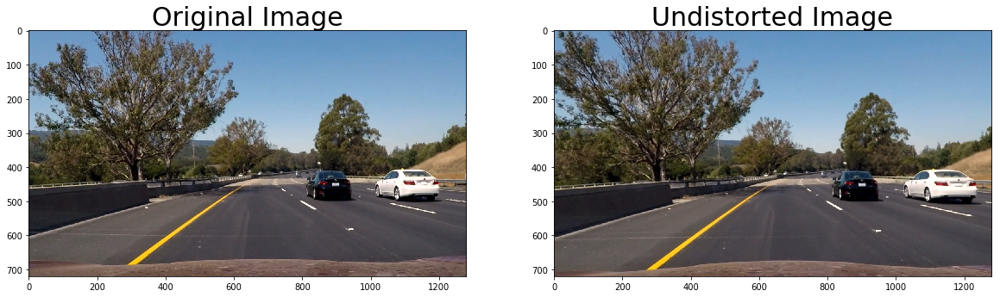

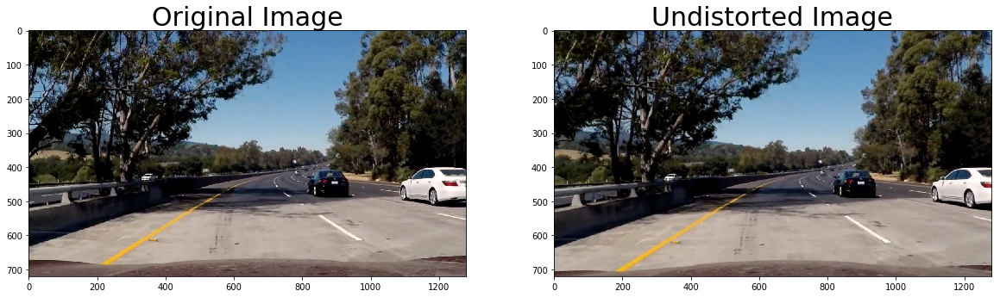

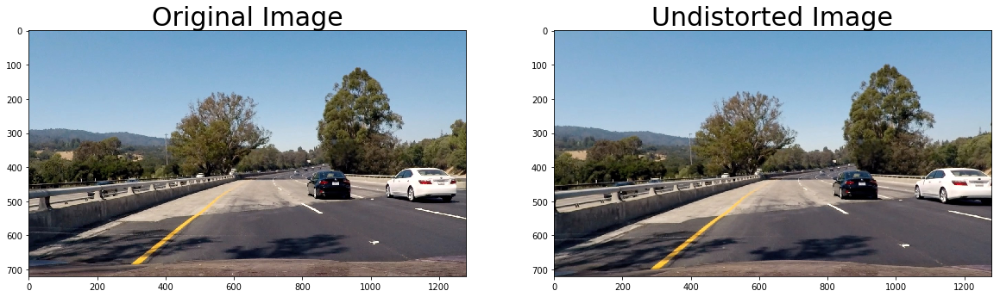

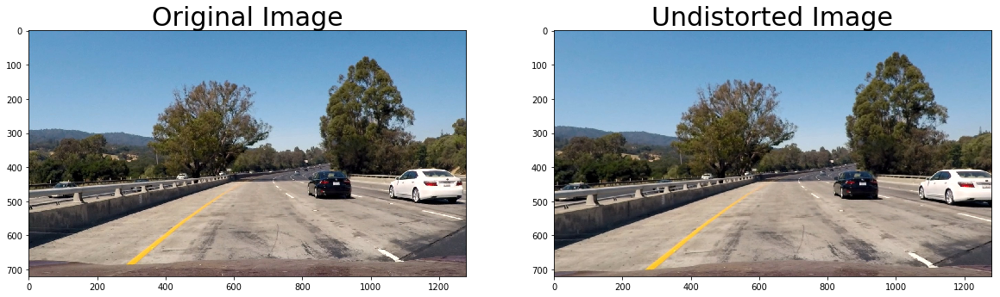

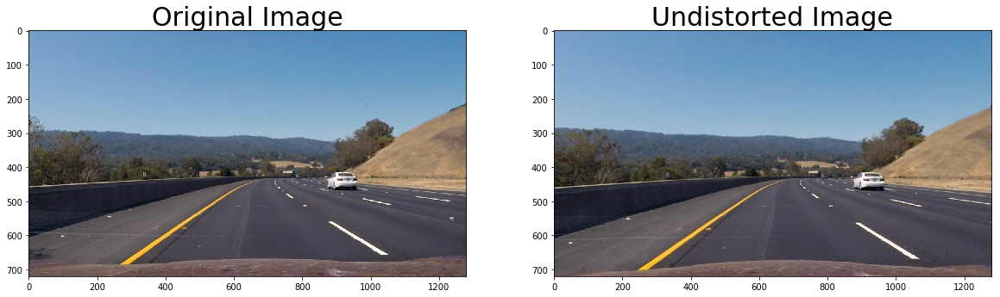

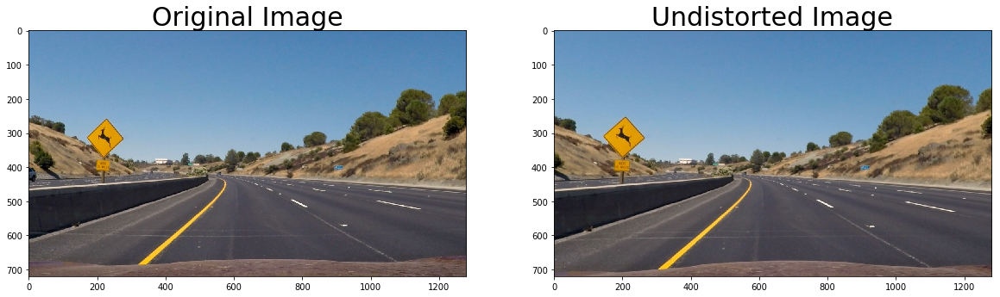

In [7]:
##Undistortion on a test image
images = glob.glob('/Users/thiyagarajanramanathan/Desktop/CarND-Advanced-Lane-Lines/test_images/test*.jpg')
for i, test_img in enumerate(images):
    test_img=cv2.imread(test_img)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
    test_dst = undistort(test_img)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(test_img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(test_dst)
    ax2.set_title('Undistorted Image', fontsize=30)

In [8]:
def unwarp(img):
    # Vertices extracted manually for performing a perspective transform
    bottom_left = [260,680]
    bottom_right = [1050, 680]
    top_left = [570, 470]
    top_right = [725, 470]
    
    source = np.float32([bottom_left,bottom_right,top_right,top_left])
    
    bottom_left = [200,680]
    bottom_right = [1000, 680]
    top_left = [200, 0]
    top_right = [1000, 0]
    
    dst = np.float32([bottom_left,bottom_right,top_right,top_left])
    M = cv2.getPerspectiveTransform(source, dst)
    Minv = cv2.getPerspectiveTransform(dst, source)
    warped = cv2.warpPerspective(img, M, (img.shape[1],img.shape[0]) , flags=cv2.INTER_LINEAR)
    
    return warped, Minv

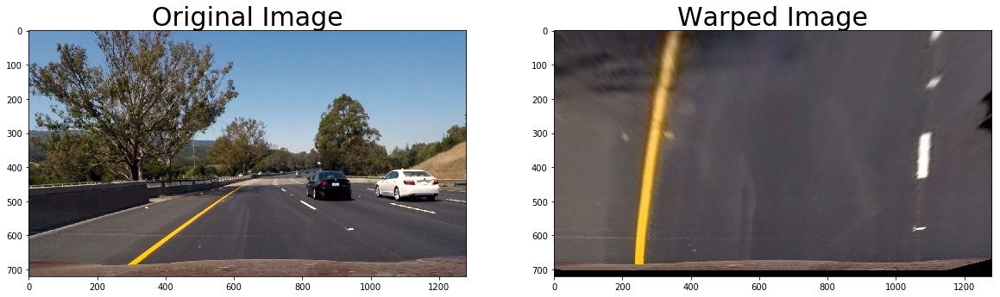

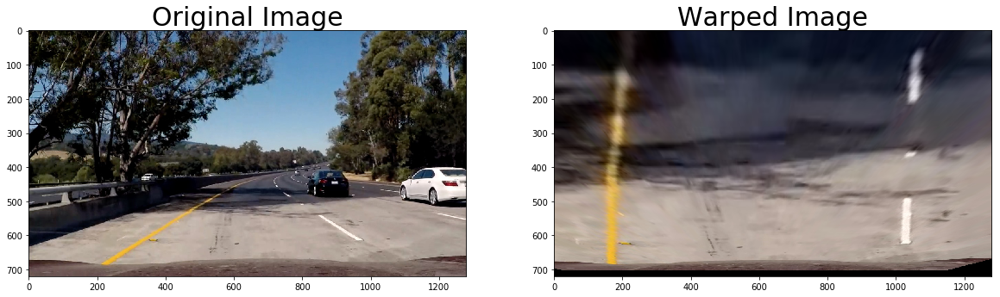

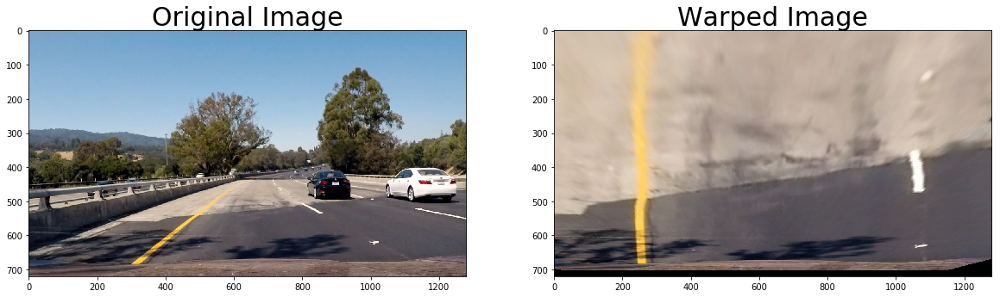

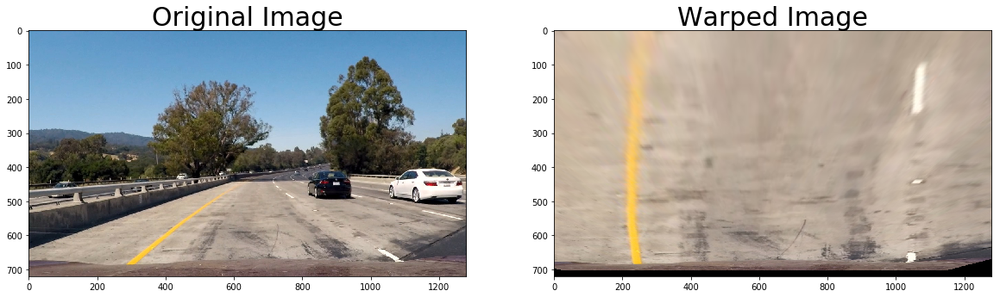

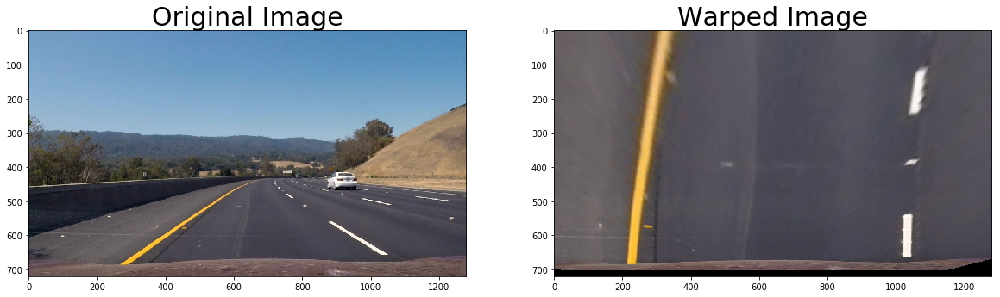

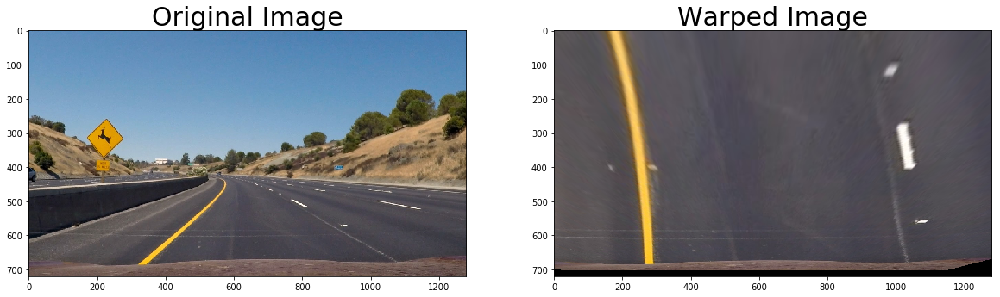

In [9]:
##Perspective transformation on a test image
for i, test_img in enumerate(images):
    test_img=cv2.imread(test_img)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
    test_dst, Minv = unwarp(test_img)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(test_img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(test_dst)
    ax2.set_title('Warped Image', fontsize=30)

In [10]:
def abs_sobel_thresh(img, orient='x', thresh=(0,255)):
    # Apply the following steps to img
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient=='x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    if orient=='y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary = np.zeros_like(scaled_sobel)
    binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    binary_output = np.copy(binary)
    return binary_output

def mag_thresh(img, sobel_kernel=3, thresh=(30, 100)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary = np.zeros_like(gradmag)
    binary[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 255

    # Return the binary image
    return binary

def dir_threshold(img, sobel_kernel=7, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    grad = np.arctan2(abs_sobely, abs_sobelx)
    binary_output = np.zeros_like(grad)
    binary_output[(grad >= thresh[0]) & (grad <= thresh[1])] = 1
    return binary_output

In [11]:
##color threshold
def color_thresh(img, thresh=(0,255)):
    S = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,2]
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    return binary

In [12]:
##thresholding the color channels
def thresh(img):
    image = np.copy(img)
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', thresh=(20, 100))
    grady = abs_sobel_thresh(image, orient='y', thresh=(20, 100))
    mag_binary = mag_thresh(image, sobel_kernel=3, thresh=(20, 100))
    dir_binary = dir_threshold(image, sobel_kernel=3, thresh=(0.7, 1.4))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 255
    col_thresh=color_thresh(img, thresh=(150,255))
    color_combined=np.zeros_like(combined)
    color_combined[(combined == 1) | (col_thresh == 1)] = 1
    return color_combined

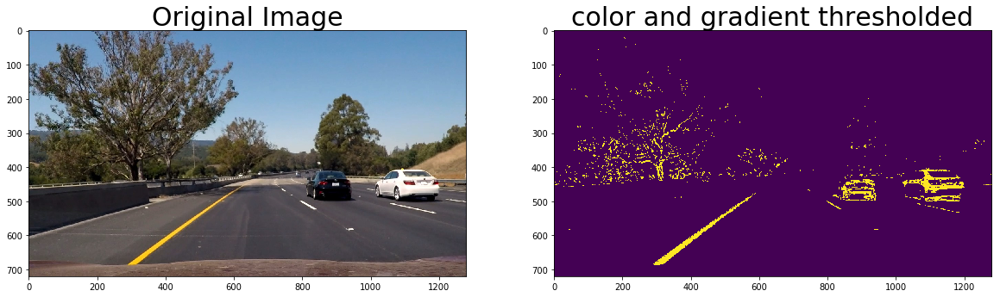

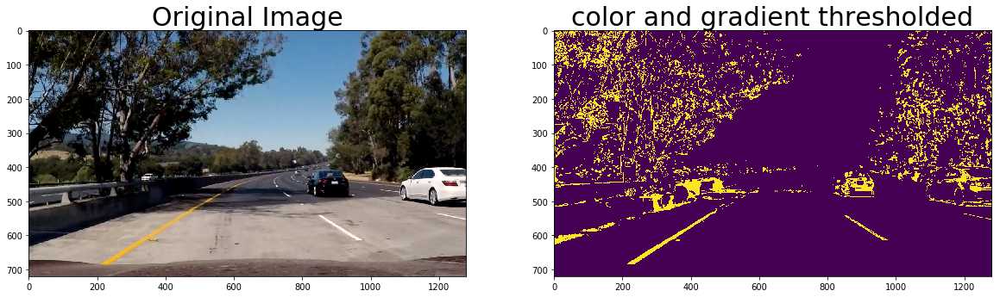

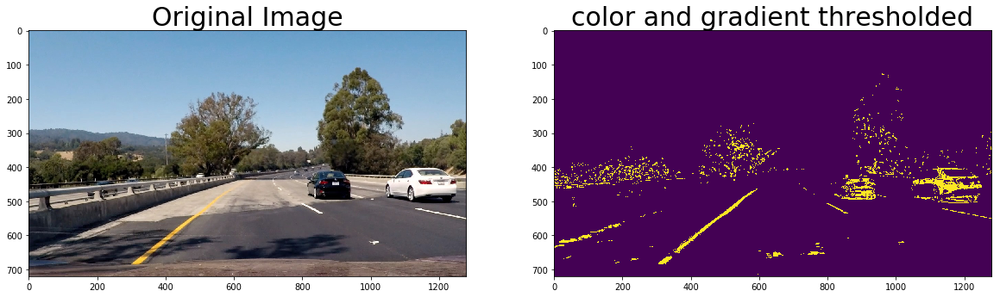

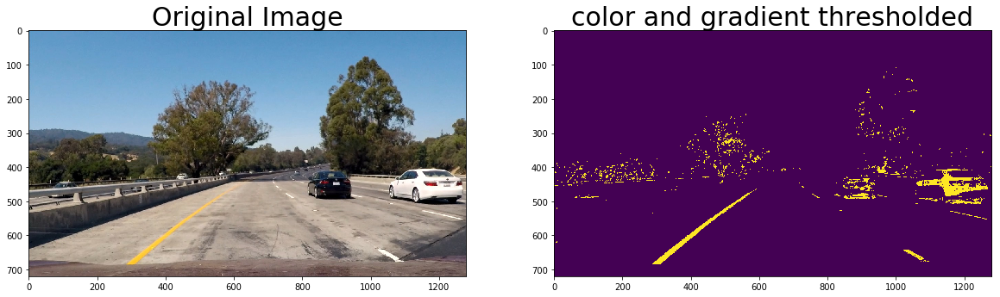

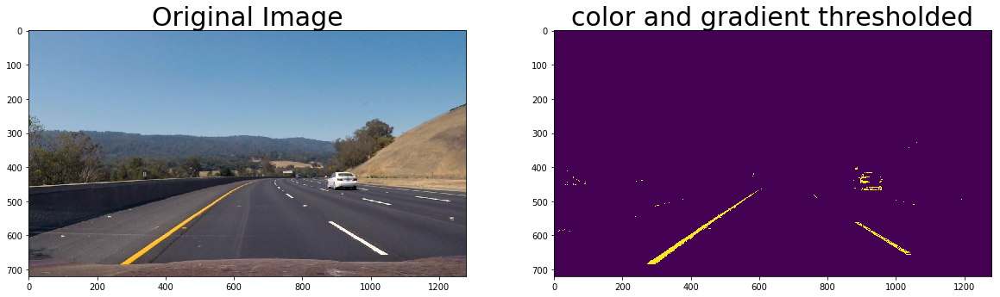

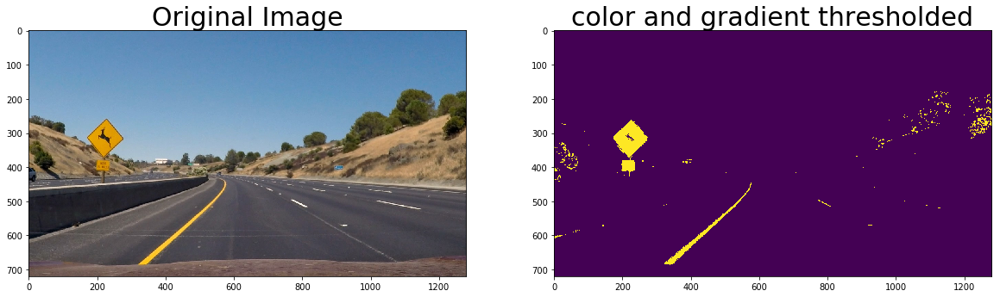

In [13]:
##threshold transformation on a test image
for i, test_img in enumerate(images):
    test_img=cv2.imread(test_img)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
    test_dst = thresh(test_img)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(test_img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(test_dst)
    ax2.set_title('color and gradient thresholded', fontsize=30)

In [27]:
def pre_process(img):
    img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB) ##changing the color space from BGR2RGB
    img=thresh(img)
    img, Minv=unwarp(img)    
    return img, Minv

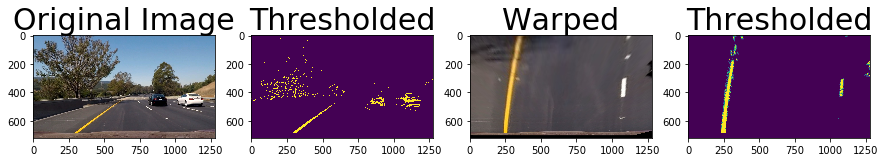

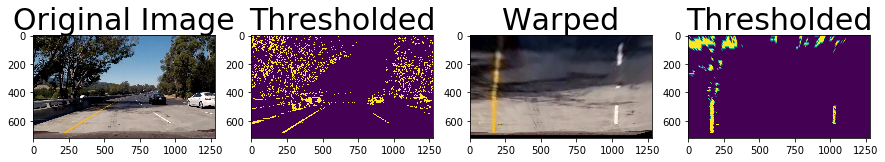

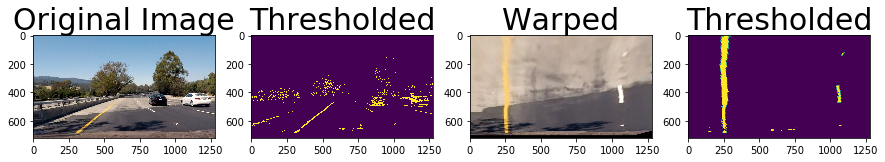

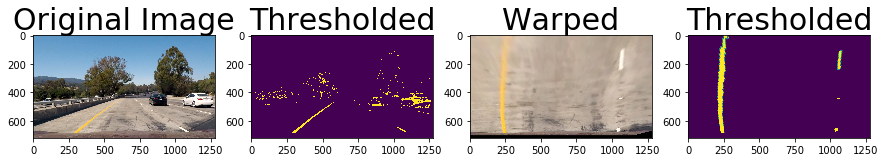

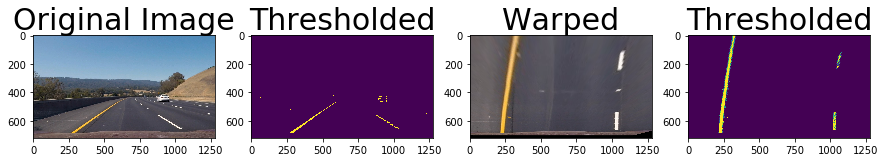

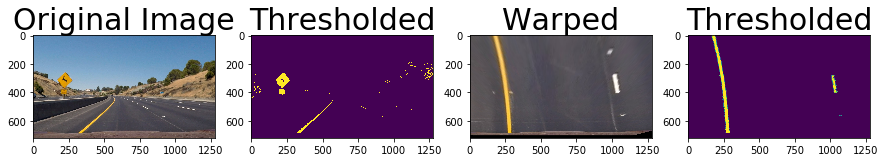

In [19]:
##threshold transformation on a test image
for i, test_img in enumerate(images):
    test_img=cv2.imread(test_img)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
    test_unwarp, Minv= unwarp(test_img)
    test_dst, Minv = pre_process(test_img)
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(15,10))
    ax1.imshow(test_img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(thresh(test_img))
    ax2.set_title('Thresholded', fontsize=30)
    ax3.imshow(test_unwarp)
    ax3.set_title('Warped', fontsize=30)
    ax4.imshow(test_dst)
    ax4.set_title('Thresholded', fontsize=30)

In [33]:
def hist(img):
    bottom_half = img[img.shape[0]//2:,:]
    histogram = np.sum(bottom_half, axis=0)
    return histogram

def find_lane_pixels(binary_warped):
    histogram = hist(binary_warped)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img
    
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    if len(leftx)==0:
        left_fit=[]
    else:
        left_fit=np.polyfit(lefty, leftx, deg=2)
    if len(rightx)==0:
        right_fit=[]
    else:
        right_fit=np.polyfit(righty, rightx, deg=2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    img=np.zeros_like(binary_warped)
    img[lefty, leftx] = 255
    img[righty, rightx] = 255
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    return img, left_fit, right_fit, ploty


In [53]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    
    
    return left_fit, right_fit, ploty
def search_around_poly(binary_warped, left_fit, right_fit):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    if len(leftx)==0:
        left_fit=[]
    else:
        left_fit = np.polyfit(lefty, leftx, 2)
        
    if len(rightx)==0:
        right_fit=[]
    else:
        right_fit = np.polyfit(righty, rightx, 2)
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,0, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,0, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    
    return binary_warped, left_fit, right_fit, ploty

In [36]:
def measure_curvature_pixels(ploty, left_fit, right_fit ):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    curvature= (left_curverad+right_curverad)/2
    return left_curverad, right_curverad

In [37]:
test_img=cv2.imread('/Users/thiyagarajanramanathan/Desktop/CarND-Advanced-Lane-Lines/test_images/test6.jpg')
bin_image, Minv = pre_process(test_img)
image, left_fit_new, right_fit_new, ploty= search_around_poly(bin_image, left_fit, right_fit)
left_rad, right_rad = measure_curvature_pixels(ploty, left_fit, right_fit)

In [38]:
def draw_lane(undist, warped, left_fit, right_fit, Minv):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    new_warp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, new_warp, 0.3, 0)
    return result

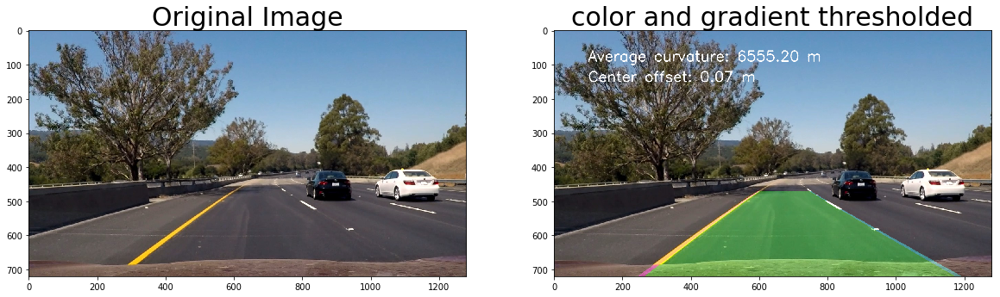

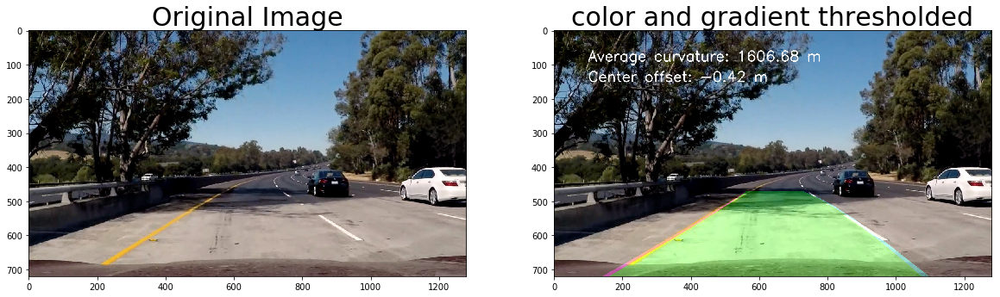

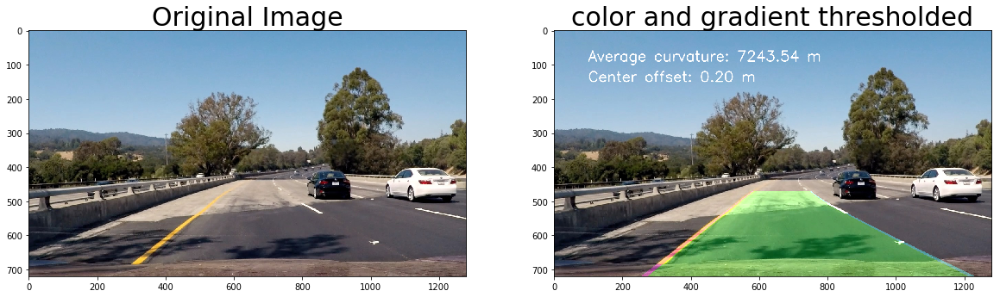

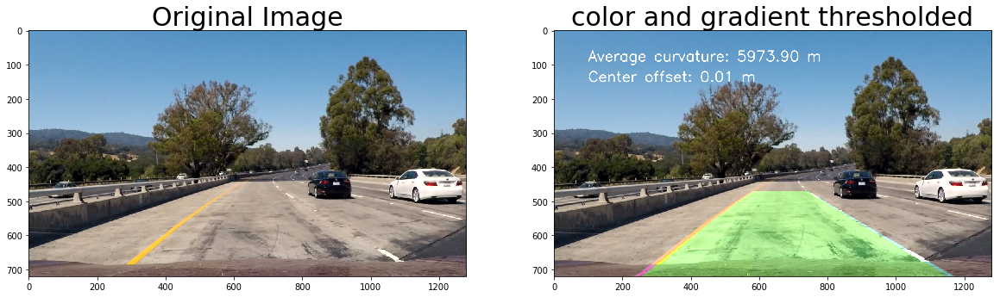

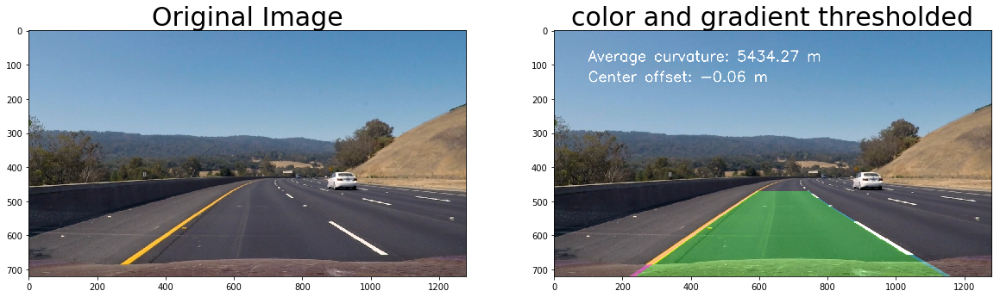

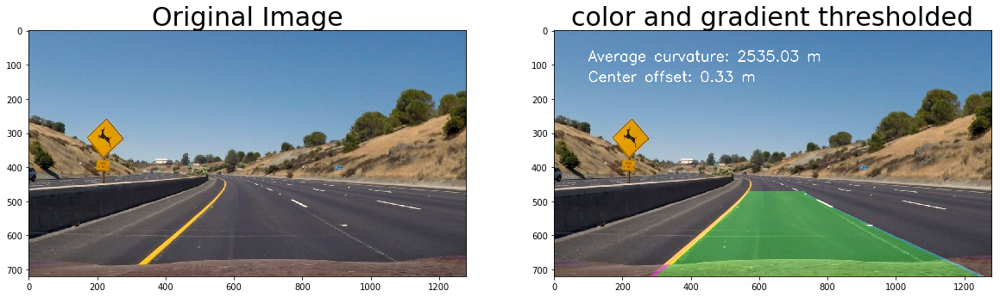

In [43]:
##threshold transformation on a test image
for i, test_img in enumerate(images):
    test_img=cv2.imread(test_img)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
    bin_image, Minv = pre_process(test_img)
    image, left_fit, right_fit, ploty = fit_polynomial(bin_image)
    left_rad, right_rad = measure_curvature_pixels(ploty, left_fit, right_fit)
    rad = (left_rad+right_rad)/2
    bottom_y = test_img.shape[0] - 1
    bottom_x_left = left_fit[0]*(bottom_y**2) + left_fit[1]*bottom_y + left_fit[2]
    bottom_x_right = right_fit[0]*(bottom_y**2) + right_fit[1]*bottom_y + right_fit[2]
    vehicle_offset = test_img.shape[1]/2 - (bottom_x_left + bottom_x_right)/2
    # Convert pixel offset to meters
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    vehicle_offset *= xm_per_pix
    curvature = 'Average curvature: %.2f m' % rad 
    lane_dist = 'Center offset: %.2f m' % -vehicle_offset
    font = cv2.FONT_HERSHEY_SIMPLEX
    final_image=draw_lane(test_img, bin_image, left_fit, right_fit, Minv)
    final_image = cv2.putText(final_image,curvature,(100, 90), font, 1.4, (255,255,255),2,cv2.LINE_AA)
    final_image = cv2.putText(final_image,lane_dist,(100, 150), font, 1.4, (255,255,255),2,cv2.LINE_AA)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(test_img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(final_image)
    ax2.set_title('color and gradient thresholded', fontsize=30)

In [44]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_fit = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0]) 
        #x values for detected line pixels
        self.allx = None
        self.counter=0
        #y values for detected line pixels
        self.ally = None
        self.fit=deque(maxlen=7)
        self.iteration=0

In [45]:
def sanity_check(left_fit, right_fit):
    #Check if left and right fit returned a value
    if len(left_fit) ==0 or len(right_fit) == 0:
        status = False
    else:
        ploty = np.linspace(0, 50, num=10 ) ##Finding the difference between the line slopes at 5 points
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        slope_diff = np.mean(right_fitx - left_fitx)
        if slope_diff >= 160 and slope_diff <=400: 
            status = True
        else:
            status = False
        
        ##Difference of slopes at the y-mid of the image
        left_mid = 2*left_fit[0]*360+left_fit[1]
        right_mid = 2*right_fit[0]*360+right_fit[1]
        slope_mid =  np.abs(left_mid-right_mid)
        if slope_mid <= 0.1:
            status = True
        else:
            status = False
            
    return status

In [46]:
def pipeline(test_img):
    bin_image, Minv = pre_process(test_img)
    #image, left_fit, right_fit, ploty = fit_polynomial(bin_image)
    
    if left.iteration==0:
        image, left_fit_new, right_fit_new, ploty = fit_polynomial(bin_image)
        left.fit.append(left_fit_new)
        right.fit.append(right_fit_new)
        left.best_fit=np.mean(left.fit, axis=0)
        right.best_fit=np.mean(right.fit, axis=0)
    else:
        image, left_fit_new, right_fit_new, ploty= search_around_poly(bin_image, left.best_fit,right.best_fit)
    sanity=sanity_check(left_fit_new, right_fit_new)
    if sanity==True:
        left.iteration+=1
        left.fit.append(left_fit_new)
        right.fit.append(right_fit_new)
        left.best_fit=np.mean(left.fit, axis=0)
        right.best_fit=np.mean(right.fit, axis=0)
        left.counter=0
        right.counter=0
    else:
        if left.counter > 5 or right.counter > 5:
            image, left_fit_new, right_fit_new, ploty = fit_polynomial(bin_image)
            left.fit.append(left_fit_new)
            right.fit.append(right_fit_new)
            left.best_fit=np.mean(left.fit, axis=0)
            right.best_fit=np.mean(right.fit, axis=0)
            left.counter = 0
            right.counter = 0
        else:
            left_fit_new, right_fit_new = left.best_fit, right.best_fit   
        left.counter += 1
        right.counter += 1
    
    final_image=draw_lane(test_img, bin_image, left.best_fit, right.best_fit, Minv)
    #print(left.fit, right.fit)
    left_rad, right_rad = measure_curvature_pixels(ploty, left.best_fit, right.best_fit)
    rad = (left_rad+right_rad)/2
    bottom_y = test_img.shape[0] - 1
    bottom_x_left = left.best_fit[0]*(bottom_y**2) + left.best_fit[1]*bottom_y + left.best_fit[2]
    bottom_x_right = right.best_fit[0]*(bottom_y**2) + right.best_fit[1]*bottom_y + right.best_fit[2]
    vehicle_offset = test_img.shape[1]/2 - (bottom_x_left + bottom_x_right)/2
    # Convert pixel offset to meters
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    vehicle_offset *= xm_per_pix
    curvature = 'Average curvature: %.2f m' % rad 
    lane_dist = 'Center offset: %.2f m' % -vehicle_offset
    font = cv2.FONT_HERSHEY_SIMPLEX
    final_image = cv2.putText(final_image,curvature,(100, 90), font, 1.4, (255,255,255),2,cv2.LINE_AA)
    final_image = cv2.putText(final_image,lane_dist,(100, 150), font, 1.4, (255,255,255),2,cv2.LINE_AA)
    return final_image
    

In [51]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
left=Line()
right=Line()
white_output = "final1.mp4"
clip1 = VideoFileClip('project_video.mp4')
white_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!

In [56]:
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video final1.mp4
[MoviePy] Writing video final1.mp4




  0%|          | 0/1261 [00:00<?, ?it/s]

  0%|          | 1/1261 [00:00<04:50,  4.34it/s]

  0%|          | 2/1261 [00:00<03:58,  5.29it/s]

  0%|          | 3/1261 [00:00<03:40,  5.70it/s]

  0%|          | 4/1261 [00:00<03:31,  5.95it/s]

  0%|          | 5/1261 [00:00<03:28,  6.01it/s]

  0%|          | 6/1261 [00:01<03:31,  5.93it/s]

  1%|          | 7/1261 [00:01<03:26,  6.08it/s]

  1%|          | 8/1261 [00:01<03:21,  6.22it/s]

  1%|          | 9/1261 [00:01<03:18,  6.32it/s]

  1%|          | 10/1261 [00:01<03:15,  6.40it/s]

  1%|          | 11/1261 [00:01<03:13,  6.46it/s]

  1%|          | 12/1261 [00:01<03:12,  6.48it/s]

  1%|          | 13/1261 [00:01<03:11,  6.52it/s]

  1%|          | 14/1261 [00:02<03:10,  6.56it/s]

  1%|          | 15/1261 [00:02<03:08,  6.61it/s]

  1%|▏         | 16/1261 [00:02<03:07,  6.65it/s]

  1%|▏         | 17/1261 [00:02<03:06,  6.69it/s]

  1%|▏         | 18/1261 [00:02<03:04,  6.72it/s]

  2%|▏         | 19/1261 [00:02<03:04,  6.75it/

 11%|█▏        | 143/1261 [00:22<02:55,  6.37it/s]

 11%|█▏        | 144/1261 [00:22<02:55,  6.36it/s]

 11%|█▏        | 145/1261 [00:22<02:55,  6.37it/s]

 12%|█▏        | 146/1261 [00:22<02:55,  6.37it/s]

 12%|█▏        | 147/1261 [00:23<02:54,  6.37it/s]

 12%|█▏        | 148/1261 [00:23<02:54,  6.37it/s]

 12%|█▏        | 149/1261 [00:23<02:54,  6.37it/s]

 12%|█▏        | 150/1261 [00:23<02:54,  6.37it/s]

 12%|█▏        | 151/1261 [00:23<02:54,  6.38it/s]

 12%|█▏        | 152/1261 [00:23<02:53,  6.38it/s]

 12%|█▏        | 153/1261 [00:23<02:53,  6.38it/s]

 12%|█▏        | 154/1261 [00:24<02:53,  6.38it/s]

 12%|█▏        | 155/1261 [00:24<02:53,  6.39it/s]

 12%|█▏        | 156/1261 [00:24<02:53,  6.38it/s]

 12%|█▏        | 157/1261 [00:24<02:52,  6.39it/s]

 13%|█▎        | 158/1261 [00:24<02:52,  6.39it/s]

 13%|█▎        | 159/1261 [00:24<02:52,  6.40it/s]

 13%|█▎        | 160/1261 [00:25<02:52,  6.40it/s]

 13%|█▎        | 161/1261 [00:25<02:51,  6.40it/s]

 13%|█▎     

 23%|██▎       | 284/1261 [00:45<02:37,  6.20it/s]

 23%|██▎       | 285/1261 [00:45<02:37,  6.20it/s]

 23%|██▎       | 286/1261 [00:46<02:37,  6.20it/s]

 23%|██▎       | 287/1261 [00:46<02:37,  6.18it/s]

 23%|██▎       | 288/1261 [00:46<02:37,  6.18it/s]

 23%|██▎       | 289/1261 [00:46<02:37,  6.18it/s]

 23%|██▎       | 290/1261 [00:46<02:37,  6.18it/s]

 23%|██▎       | 291/1261 [00:47<02:37,  6.18it/s]

 23%|██▎       | 292/1261 [00:47<02:37,  6.17it/s]

 23%|██▎       | 293/1261 [00:47<02:36,  6.17it/s]

 23%|██▎       | 294/1261 [00:47<02:36,  6.17it/s]

 23%|██▎       | 295/1261 [00:47<02:36,  6.17it/s]

 23%|██▎       | 296/1261 [00:47<02:36,  6.17it/s]

 24%|██▎       | 297/1261 [00:48<02:36,  6.17it/s]

 24%|██▎       | 298/1261 [00:48<02:35,  6.18it/s]

 24%|██▎       | 299/1261 [00:48<02:35,  6.17it/s]

 24%|██▍       | 300/1261 [00:48<02:35,  6.18it/s]

 24%|██▍       | 301/1261 [00:48<02:35,  6.18it/s]

 24%|██▍       | 302/1261 [00:48<02:35,  6.18it/s]

 24%|██▍    

 34%|███▎      | 425/1261 [01:10<02:19,  5.99it/s]

 34%|███▍      | 426/1261 [01:11<02:19,  5.99it/s]

 34%|███▍      | 427/1261 [01:11<02:19,  5.99it/s]

 34%|███▍      | 428/1261 [01:11<02:19,  5.99it/s]

 34%|███▍      | 429/1261 [01:11<02:19,  5.98it/s]

 34%|███▍      | 430/1261 [01:11<02:18,  5.98it/s]

 34%|███▍      | 431/1261 [01:12<02:18,  5.97it/s]

 34%|███▍      | 432/1261 [01:12<02:18,  5.97it/s]

 34%|███▍      | 433/1261 [01:12<02:18,  5.97it/s]

 34%|███▍      | 434/1261 [01:12<02:18,  5.96it/s]

 34%|███▍      | 435/1261 [01:12<02:18,  5.96it/s]

 35%|███▍      | 436/1261 [01:13<02:18,  5.96it/s]

 35%|███▍      | 437/1261 [01:13<02:18,  5.96it/s]

 35%|███▍      | 438/1261 [01:13<02:18,  5.96it/s]

 35%|███▍      | 439/1261 [01:13<02:17,  5.96it/s]

 35%|███▍      | 440/1261 [01:13<02:17,  5.96it/s]

 35%|███▍      | 441/1261 [01:13<02:17,  5.96it/s]

 35%|███▌      | 442/1261 [01:14<02:17,  5.96it/s]

 35%|███▌      | 443/1261 [01:14<02:17,  5.96it/s]

 35%|███▌   

 45%|████▍     | 566/1261 [01:34<01:55,  6.02it/s]

 45%|████▍     | 567/1261 [01:34<01:55,  6.02it/s]

 45%|████▌     | 568/1261 [01:34<01:55,  6.02it/s]

 45%|████▌     | 569/1261 [01:34<01:54,  6.02it/s]

 45%|████▌     | 570/1261 [01:34<01:54,  6.02it/s]

 45%|████▌     | 571/1261 [01:34<01:54,  6.02it/s]

 45%|████▌     | 572/1261 [01:35<01:54,  6.02it/s]

 45%|████▌     | 573/1261 [01:35<01:54,  6.02it/s]

 46%|████▌     | 574/1261 [01:35<01:54,  6.02it/s]

 46%|████▌     | 575/1261 [01:35<01:53,  6.02it/s]

 46%|████▌     | 576/1261 [01:35<01:53,  6.02it/s]

 46%|████▌     | 577/1261 [01:35<01:53,  6.02it/s]

 46%|████▌     | 578/1261 [01:35<01:53,  6.02it/s]

 46%|████▌     | 579/1261 [01:36<01:53,  6.02it/s]

 46%|████▌     | 580/1261 [01:36<01:53,  6.02it/s]

 46%|████▌     | 581/1261 [01:36<01:52,  6.02it/s]

 46%|████▌     | 582/1261 [01:36<01:52,  6.02it/s]

 46%|████▌     | 583/1261 [01:36<01:52,  6.02it/s]

 46%|████▋     | 584/1261 [01:36<01:52,  6.02it/s]

 46%|████▋  

 56%|█████▌    | 707/1261 [01:56<01:31,  6.04it/s]

 56%|█████▌    | 708/1261 [01:57<01:31,  6.04it/s]

 56%|█████▌    | 709/1261 [01:57<01:31,  6.04it/s]

 56%|█████▋    | 710/1261 [01:57<01:31,  6.04it/s]

 56%|█████▋    | 711/1261 [01:57<01:30,  6.05it/s]

 56%|█████▋    | 712/1261 [01:57<01:30,  6.05it/s]

 57%|█████▋    | 713/1261 [01:57<01:30,  6.05it/s]

 57%|█████▋    | 714/1261 [01:58<01:30,  6.05it/s]

 57%|█████▋    | 715/1261 [01:58<01:30,  6.05it/s]

 57%|█████▋    | 716/1261 [01:58<01:30,  6.05it/s]

 57%|█████▋    | 717/1261 [01:58<01:29,  6.05it/s]

 57%|█████▋    | 718/1261 [01:58<01:29,  6.05it/s]

 57%|█████▋    | 719/1261 [01:58<01:29,  6.05it/s]

 57%|█████▋    | 720/1261 [01:58<01:29,  6.05it/s]

 57%|█████▋    | 721/1261 [01:59<01:29,  6.05it/s]

 57%|█████▋    | 722/1261 [01:59<01:29,  6.05it/s]

 57%|█████▋    | 723/1261 [01:59<01:28,  6.05it/s]

 57%|█████▋    | 724/1261 [01:59<01:28,  6.05it/s]

 57%|█████▋    | 725/1261 [01:59<01:28,  6.05it/s]

 58%|█████▊ 

 67%|██████▋   | 848/1261 [02:19<01:08,  6.06it/s]

 67%|██████▋   | 849/1261 [02:20<01:07,  6.06it/s]

 67%|██████▋   | 850/1261 [02:20<01:07,  6.06it/s]

 67%|██████▋   | 851/1261 [02:20<01:07,  6.06it/s]

 68%|██████▊   | 852/1261 [02:20<01:07,  6.06it/s]

 68%|██████▊   | 853/1261 [02:20<01:07,  6.06it/s]

 68%|██████▊   | 854/1261 [02:20<01:07,  6.06it/s]

 68%|██████▊   | 855/1261 [02:20<01:06,  6.06it/s]

 68%|██████▊   | 856/1261 [02:21<01:06,  6.07it/s]

 68%|██████▊   | 857/1261 [02:21<01:06,  6.07it/s]

 68%|██████▊   | 858/1261 [02:21<01:06,  6.07it/s]

 68%|██████▊   | 859/1261 [02:21<01:06,  6.07it/s]

 68%|██████▊   | 860/1261 [02:21<01:06,  6.07it/s]

 68%|██████▊   | 861/1261 [02:21<01:05,  6.07it/s]

 68%|██████▊   | 862/1261 [02:22<01:05,  6.07it/s]

 68%|██████▊   | 863/1261 [02:22<01:05,  6.07it/s]

 69%|██████▊   | 864/1261 [02:22<01:05,  6.07it/s]

 69%|██████▊   | 865/1261 [02:22<01:05,  6.07it/s]

 69%|██████▊   | 866/1261 [02:22<01:05,  6.07it/s]

 69%|██████▉

 78%|███████▊  | 989/1261 [02:42<00:44,  6.07it/s]

 79%|███████▊  | 990/1261 [02:43<00:44,  6.07it/s]

 79%|███████▊  | 991/1261 [02:43<00:44,  6.07it/s]

 79%|███████▊  | 992/1261 [02:43<00:44,  6.07it/s]

 79%|███████▊  | 993/1261 [02:43<00:44,  6.07it/s]

 79%|███████▉  | 994/1261 [02:43<00:44,  6.07it/s]

 79%|███████▉  | 995/1261 [02:44<00:43,  6.07it/s]

 79%|███████▉  | 996/1261 [02:44<00:43,  6.06it/s]

 79%|███████▉  | 997/1261 [02:44<00:43,  6.06it/s]

 79%|███████▉  | 998/1261 [02:44<00:43,  6.06it/s]

 79%|███████▉  | 999/1261 [02:44<00:43,  6.06it/s]

 79%|███████▉  | 1000/1261 [02:45<00:43,  6.06it/s]

 79%|███████▉  | 1001/1261 [02:45<00:42,  6.06it/s]

 79%|███████▉  | 1002/1261 [02:45<00:42,  6.06it/s]

 80%|███████▉  | 1003/1261 [02:45<00:42,  6.06it/s]

 80%|███████▉  | 1004/1261 [02:45<00:42,  6.06it/s]

 80%|███████▉  | 1005/1261 [02:46<00:42,  6.05it/s]

 80%|███████▉  | 1006/1261 [02:46<00:42,  6.05it/s]

 80%|███████▉  | 1007/1261 [02:46<00:41,  6.05it/s]

 80%

 89%|████████▉ | 1128/1261 [03:07<00:22,  6.02it/s]

 90%|████████▉ | 1129/1261 [03:07<00:21,  6.01it/s]

 90%|████████▉ | 1130/1261 [03:07<00:21,  6.01it/s]

 90%|████████▉ | 1131/1261 [03:08<00:21,  6.01it/s]

 90%|████████▉ | 1132/1261 [03:08<00:21,  6.02it/s]

 90%|████████▉ | 1133/1261 [03:08<00:21,  6.01it/s]

 90%|████████▉ | 1134/1261 [03:08<00:21,  6.01it/s]

 90%|█████████ | 1135/1261 [03:08<00:20,  6.01it/s]

 90%|█████████ | 1136/1261 [03:08<00:20,  6.01it/s]

 90%|█████████ | 1137/1261 [03:09<00:20,  6.01it/s]

 90%|█████████ | 1138/1261 [03:09<00:20,  6.01it/s]

 90%|█████████ | 1139/1261 [03:09<00:20,  6.01it/s]

 90%|█████████ | 1140/1261 [03:09<00:20,  6.01it/s]

 90%|█████████ | 1141/1261 [03:09<00:19,  6.01it/s]

 91%|█████████ | 1142/1261 [03:09<00:19,  6.01it/s]

 91%|█████████ | 1143/1261 [03:10<00:19,  6.01it/s]

 91%|█████████ | 1144/1261 [03:10<00:19,  6.01it/s]

 91%|█████████ | 1145/1261 [03:10<00:19,  6.01it/s]

 91%|█████████ | 1146/1261 [03:10<00:19,  6.01

[MoviePy] Done.
[MoviePy] >>>> Video ready: final1.mp4 

CPU times: user 5min 38s, sys: 54 s, total: 6min 32s
Wall time: 3min 30s
